In [90]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load



# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory



# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

In [91]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

from umap import UMAP

sns.set_theme(
    style="whitegrid",
    context="talk"
)

In [92]:
data = np.load(
    "/kaggle/input/notebooks/mehtab9000/embeddings-extraction/embeddings.npz",
    allow_pickle=True
)

simclr_embeddings = data["simclr"]
mae_embeddings = data["mae"]

labels = data["labels"]
paths = data["paths"]

print(simclr_embeddings.shape)
print(mae_embeddings.shape)
print(labels.shape)

(3511, 2048)
(3511, 192)
(3511,)


In [93]:
simclr_scaled = StandardScaler().fit_transform(
    simclr_embeddings
)

mae_scaled = StandardScaler().fit_transform(
    mae_embeddings
)

print("Scaling complete")

Scaling complete


In [94]:
tsne = TSNE(
    n_components=2,
    perplexity=30,
    random_state=42,
    init="pca"
)

simclr_tsne = tsne.fit_transform(
    simclr_scaled
)

mae_tsne = tsne.fit_transform(
    mae_scaled
)

print("t-SNE complete")

t-SNE complete


In [95]:
umap_model = UMAP(
    n_components=2,
    random_state=42
)

simclr_umap = umap_model.fit_transform(
    simclr_scaled
)

mae_umap = umap_model.fit_transform(
    mae_scaled
)

print("UMAP complete")

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



UMAP complete


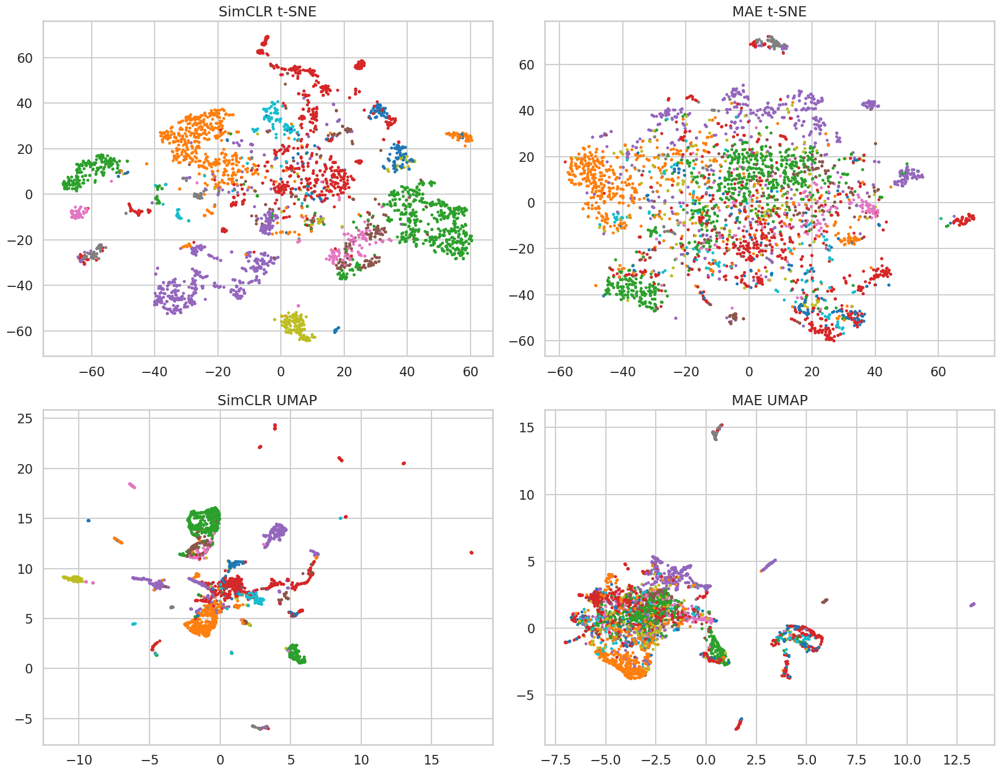

In [96]:
fig, axes = plt.subplots(
    2,
    2,
    figsize=(18,14)
)

sns.scatterplot(
    x=simclr_tsne[:,0],
    y=simclr_tsne[:,1],
    hue=labels,
    palette="tab10",
    s=15,
    linewidth=0,
    legend=False,
    ax=axes[0,0]
)

axes[0,0].set_title(
    "SimCLR t-SNE"
)

sns.scatterplot(
    x=mae_tsne[:,0],
    y=mae_tsne[:,1],
    hue=labels,
    palette="tab10",
    s=15,
    linewidth=0,
    legend=False,
    ax=axes[0,1]
)

axes[0,1].set_title(
    "MAE t-SNE"
)

sns.scatterplot(
    x=simclr_umap[:,0],
    y=simclr_umap[:,1],
    hue=labels,
    palette="tab10",
    s=15,
    linewidth=0,
    legend=False,
    ax=axes[1,0]
)

axes[1,0].set_title(
    "SimCLR UMAP"
)

sns.scatterplot(
    x=mae_umap[:,0],
    y=mae_umap[:,1],
    hue=labels,
    palette="tab10",
    s=15,
    linewidth=0,
    legend=False,
    ax=axes[1,1]
)

axes[1,1].set_title(
    "MAE UMAP"
)

plt.tight_layout()

plt.savefig(
    "Figure_5_6_Latent_Visualizations.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [97]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import plotly.express as px

simclr_scaled = StandardScaler().fit_transform(
    simclr_embeddings
)

simclr_tsne_3d = TSNE(
    n_components=3,
    perplexity=30,
    random_state=42,
    init="pca"
).fit_transform(
    simclr_scaled
)

fig = px.scatter_3d(
    x=simclr_tsne_3d[:,0],
    y=simclr_tsne_3d[:,1],
    z=simclr_tsne_3d[:,2],
    color=labels.astype(str),
    title="SimCLR 3D t-SNE"
)

fig.update_traces(
    marker=dict(
        size=2.5
    )
)

fig.write_html(
    "/kaggle/working/simclr_tsne_3dPLOT.html"
)

print("saved")

saved


In [98]:
mae_scaled = StandardScaler().fit_transform(
    mae_embeddings
)

mae_tsne_3d = TSNE(
    n_components=3,
    perplexity=30,
    random_state=42,
    init="pca"
).fit_transform(
    mae_scaled
)

fig = px.scatter_3d(
    x=mae_tsne_3d[:,0],
    y=mae_tsne_3d[:,1],
    z=mae_tsne_3d[:,2],
    color=labels.astype(str),
    title="MAE 3D t-SNE"
)

fig.update_traces(
    marker=dict(
        size=2.5
    )
)

fig.write_html(
    "/kaggle/working/mae_tsne_3dPLOT.html"
)

print("saved")

saved


In [99]:
from umap import UMAP

simclr_umap_3d = UMAP(
    n_components=3,
    random_state=42
).fit_transform(
    simclr_scaled
)

fig = px.scatter_3d(
    x=simclr_umap_3d[:,0],
    y=simclr_umap_3d[:,1],
    z=simclr_umap_3d[:,2],
    color=labels.astype(str),
    title="SimCLR 3D UMAP"
)

fig.update_traces(
    marker=dict(
        size=2.5
    )
)

fig.write_html(
    "/kaggle/working/simclr_umap_3dPLOT.html"
)

print("saved")

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



saved


In [100]:
mae_umap_3d = UMAP(
    n_components=3,
    random_state=42
).fit_transform(
    mae_scaled
)

fig = px.scatter_3d(
    x=mae_umap_3d[:,0],
    y=mae_umap_3d[:,1],
    z=mae_umap_3d[:,2],
    color=labels.astype(str),
    title="MAE 3D UMAP"
)

fig.update_traces(
    marker=dict(
        size=2.5
    )
)

fig.write_html(
    "/kaggle/working/mae_umap_3dPLOT.html"
)

print("saved")

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



saved


In [101]:
import os

for f in sorted(os.listdir("/kaggle/working")):
    if f.endswith(".html"):
        print(f)

mae_tsne_3d.html
mae_tsne_3dCLEAR.html
mae_tsne_3dPLOT.html
mae_umap_3d.html
mae_umap_3dCLEAR.html
mae_umap_3dPLOT.html
simclr_improved_tsne_3d.html
simclr_tsne_3d.html
simclr_tsne_3dCLEAR.html
simclr_tsne_3dPLOT.html
simclr_umap_3d.html
simclr_umap_3dCLEAR.html
simclr_umap_3dPLOT.html


In [102]:
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score
)

simclr_sil = silhouette_score(simclr_scaled, labels)
simclr_db = davies_bouldin_score(simclr_scaled, labels)
simclr_ch = calinski_harabasz_score(simclr_scaled, labels)

mae_sil = silhouette_score(mae_scaled, labels)
mae_db = davies_bouldin_score(mae_scaled, labels)
mae_ch = calinski_harabasz_score(mae_scaled, labels)

print("SIMCLR")
print("Silhouette:", simclr_sil)
print("Davies-Bouldin:", simclr_db)
print("Calinski-Harabasz:", simclr_ch)

print("\nMAE")
print("Silhouette:", mae_sil)
print("Davies-Bouldin:", mae_db)
print("Calinski-Harabasz:", mae_ch)

SIMCLR
Silhouette: 0.08694966
Davies-Bouldin: 2.6452510476267515
Calinski-Harabasz: 60.43785

MAE
Silhouette: -0.059990272
Davies-Bouldin: 4.146089048040714
Calinski-Harabasz: 53.134468


In [103]:
metrics_df = pd.DataFrame({
    "Model": ["SimCLR", "MAE"],
    "Silhouette": [simclr_sil, mae_sil],
    "Davies_Bouldin": [simclr_db, mae_db],
    "Calinski_Harabasz": [simclr_ch, mae_ch]
})

metrics_df

,Model,Silhouette,Davies_Bouldin,Calinski_Harabasz
0,SimCLR,0.08695,2.645251,60.437851
1,MAE,-0.05999,4.146089,53.134468


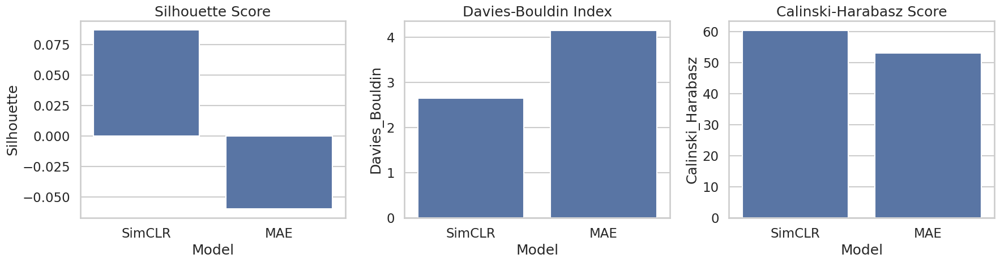

In [104]:
fig, axes = plt.subplots(
    1,
    3,
    figsize=(18,5)
)

sns.barplot(
    data=metrics_df,
    x="Model",
    y="Silhouette",
    ax=axes[0]
)

axes[0].set_title("Silhouette Score")

sns.barplot(
    data=metrics_df,
    x="Model",
    y="Davies_Bouldin",
    ax=axes[1]
)

axes[1].set_title("Davies-Bouldin Index")

sns.barplot(
    data=metrics_df,
    x="Model",
    y="Calinski_Harabasz",
    ax=axes[2]
)

axes[2].set_title("Calinski-Harabasz Score")

plt.tight_layout()

plt.savefig(
    "cluster_metrics.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [105]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

results = []

models = {
    "SimCLR": simclr_scaled,
    "MAE": mae_scaled
}

for name, emb in models.items():

    X_train, X_test, y_train, y_test = train_test_split(
        emb,
        labels,
        test_size=0.2,
        random_state=42,
        stratify=labels
    )

    knn = KNeighborsClassifier(
        n_neighbors=5
    )

    knn.fit(X_train, y_train)

    preds = knn.predict(X_test)

    results.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, preds),
        "Precision": precision_score(
            y_test,
            preds,
            average="macro",
            zero_division=0
        ),
        "Recall": recall_score(
            y_test,
            preds,
            average="macro",
            zero_division=0
        ),
        "F1": f1_score(
            y_test,
            preds,
            average="macro",
            zero_division=0
        )
    })

eval_df = pd.DataFrame(results)

eval_df

,Model,Accuracy,Precision,Recall,F1
0,SimCLR,0.866287,0.865476,0.783725,0.809952
1,MAE,0.687055,0.650825,0.552322,0.572288


In [106]:
eval_df.to_csv(
    "knn_metrics.csv",
    index=False
)

eval_df

,Model,Accuracy,Precision,Recall,F1
0,SimCLR,0.866287,0.865476,0.783725,0.809952
1,MAE,0.687055,0.650825,0.552322,0.572288


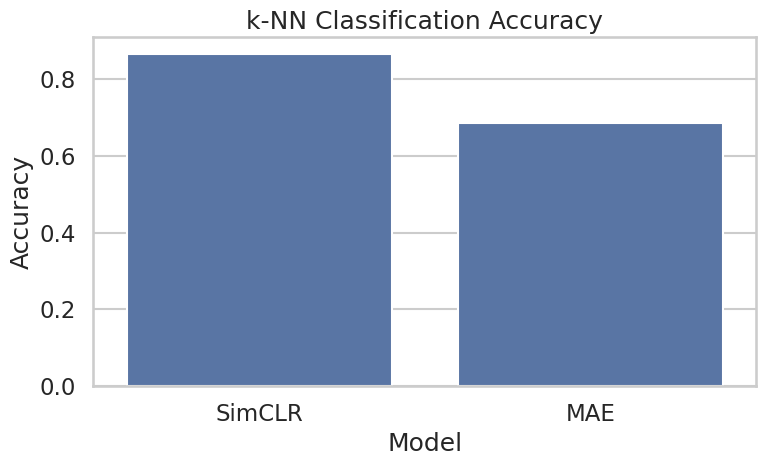

In [107]:
fig, ax = plt.subplots(
    figsize=(8,5)
)

sns.barplot(
    data=eval_df,
    x="Model",
    y="Accuracy"
)

plt.title(
    "k-NN Classification Accuracy"
)

plt.tight_layout()

plt.savefig(
    "knn_accuracy.png",
    dpi=300
)

plt.show()

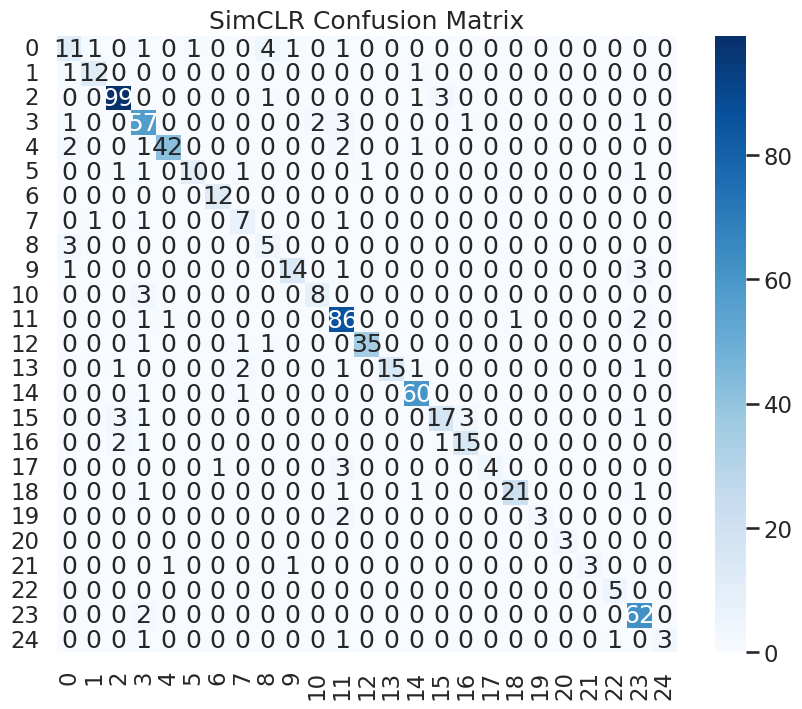

In [108]:
from sklearn.metrics import confusion_matrix

X_train, X_test, y_train, y_test = train_test_split(
    simclr_scaled,
    labels,
    test_size=0.2,
    random_state=42,
    stratify=labels
)

knn = KNeighborsClassifier(
    n_neighbors=5
)

knn.fit(X_train, y_train)

simclr_preds = knn.predict(X_test)

cm = confusion_matrix(
    y_test,
    simclr_preds
)

plt.figure(figsize=(10,8))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues"
)

plt.title(
    "SimCLR Confusion Matrix"
)

plt.savefig(
    "simclr_confusion_matrix.png",
    dpi=300
)

plt.show()

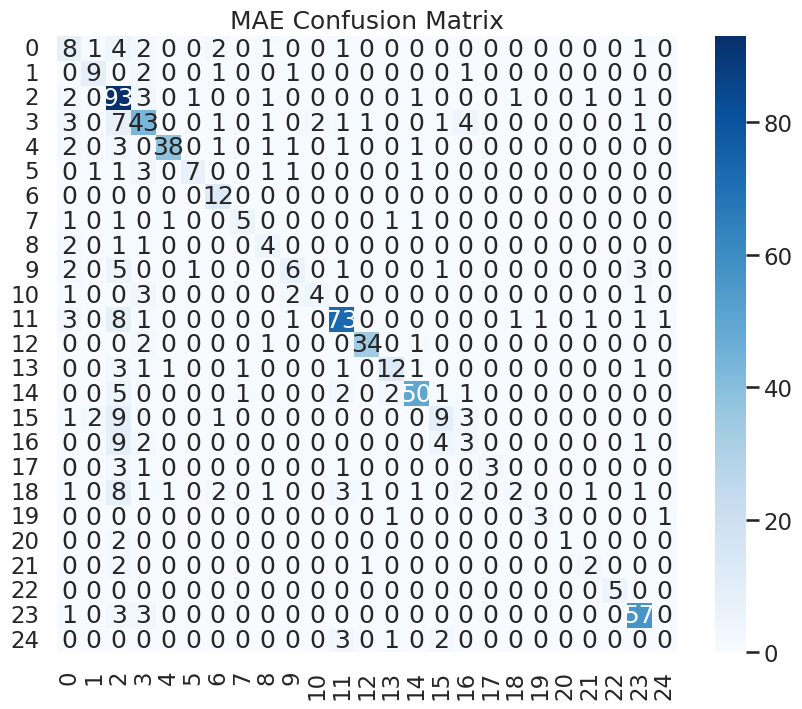

In [109]:
X_train, X_test, y_train, y_test = train_test_split(
    mae_scaled,
    labels,
    test_size=0.2,
    random_state=42,
    stratify=labels
)

knn.fit(X_train, y_train)

mae_preds = knn.predict(X_test)

cm = confusion_matrix(
    y_test,
    mae_preds
)

plt.figure(figsize=(10,8))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues"
)

plt.title(
    "MAE Confusion Matrix"
)

plt.savefig(
    "mae_confusion_matrix.png",
    dpi=300
)

plt.show()

In [110]:
simclr_centered = (
    simclr_embeddings -
    simclr_embeddings.mean(axis=0)
)

mae_centered = (
    mae_embeddings -
    mae_embeddings.mean(axis=0)
)

In [111]:
_, simclr_s, _ = np.linalg.svd(
    simclr_centered,
    full_matrices=False
)

_, mae_s, _ = np.linalg.svd(
    mae_centered,
    full_matrices=False
)

print(
    len(simclr_s),
    len(mae_s)
)

2048 192


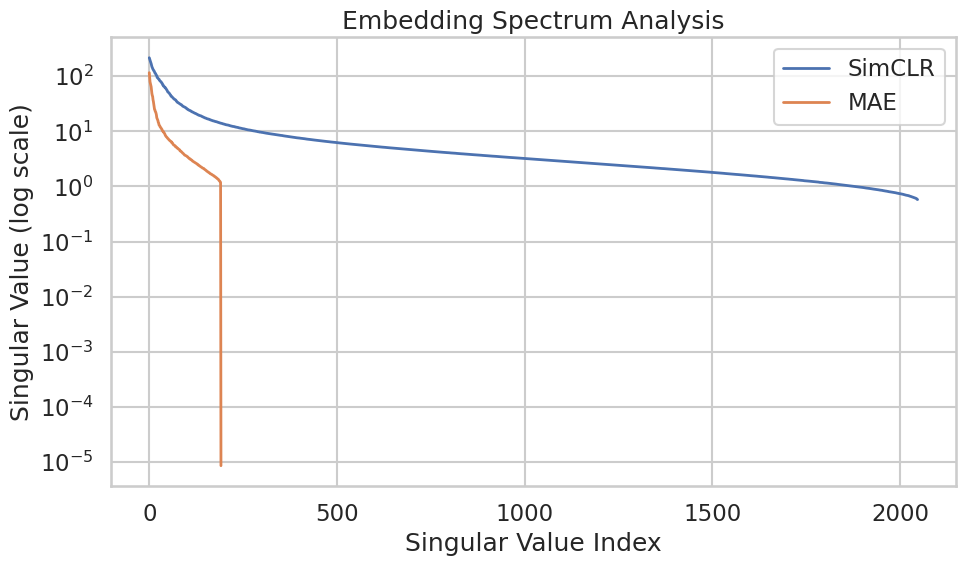

In [112]:
plt.figure(
    figsize=(10,6)
)

plt.plot(
    simclr_s,
    linewidth=2,
    label="SimCLR"
)

plt.plot(
    mae_s,
    linewidth=2,
    label="MAE"
)

plt.yscale("log")

plt.xlabel(
    "Singular Value Index"
)

plt.ylabel(
    "Singular Value (log scale)"
)

plt.title(
    "Embedding Spectrum Analysis"
)

plt.legend()

plt.grid(True)

plt.tight_layout()

plt.savefig(
    "svd_spectrum.png",
    dpi=300
)

plt.show()

In [113]:
def effective_rank(singular_values):

    p = singular_values**2

    p = p / p.sum()

    entropy = -np.sum(
        p * np.log(
            p + 1e-12
        )
    )

    return np.exp(entropy)

print(
    "SimCLR Effective Rank:",
    effective_rank(simclr_s)
)

print(
    "MAE Effective Rank:",
    effective_rank(mae_s)
)

SimCLR Effective Rank: 89.920525
MAE Effective Rank: 19.36943


In [114]:
from sklearn.metrics.pairwise import cosine_similarity

In [115]:
def compute_similarity_distributions(
    embeddings,
    labels,
    sample_size=1000
):

    rng = np.random.default_rng(42)

    idx = rng.choice(
        len(labels),
        size=min(sample_size, len(labels)),
        replace=False
    )

    emb = embeddings[idx]
    lab = labels[idx]

    sim_matrix = cosine_similarity(
        emb
    )

    intra = []
    inter = []

    n = len(idx)

    for i in range(n):

        for j in range(i + 1, n):

            if lab[i] == lab[j]:

                intra.append(
                    sim_matrix[i, j]
                )

            else:

                inter.append(
                    sim_matrix[i, j]
                )

    return (
        np.array(intra),
        np.array(inter)
    )

In [116]:
simclr_intra, simclr_inter = (
    compute_similarity_distributions(
        simclr_scaled,
        labels
    )
)

mae_intra, mae_inter = (
    compute_similarity_distributions(
        mae_scaled,
        labels
    )
)

print(
    len(simclr_intra),
    len(simclr_inter)
)

37002 462498


In [117]:
print("SIMCLR")

print(
    "Intra-class:",
    simclr_intra.mean()
)

print(
    "Inter-class:",
    simclr_inter.mean()
)

print(
    "Gap:",
    simclr_intra.mean()
    -
    simclr_inter.mean()
)

print("\nMAE")

print(
    "Intra-class:",
    mae_intra.mean()
)

print(
    "Inter-class:",
    mae_inter.mean()
)

print(
    "Gap:",
    mae_intra.mean()
    -
    mae_inter.mean()
)

SIMCLR
Intra-class: 0.24286346
Inter-class: -0.019313652
Gap: 0.2621771

MAE
Intra-class: 0.23311338
Inter-class: -0.014168419
Gap: 0.24728179


In [118]:
plot_df = pd.DataFrame({

    "Similarity":

        list(simclr_intra[:5000])
        +
        list(simclr_inter[:5000])
        +
        list(mae_intra[:5000])
        +
        list(mae_inter[:5000]),

    "Group":

        ["SimCLR Intra"] * 5000
        +
        ["SimCLR Inter"] * 5000
        +
        ["MAE Intra"] * 5000
        +
        ["MAE Inter"] * 5000
})

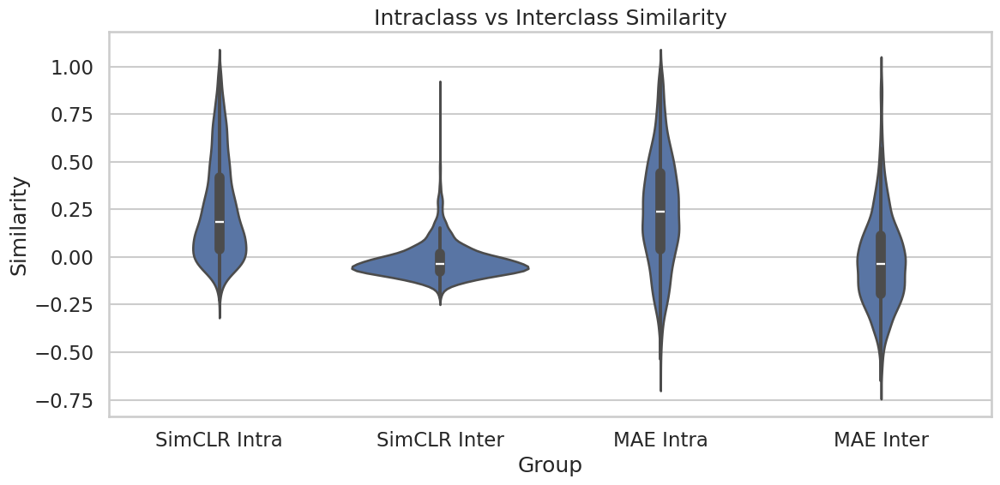

In [119]:
plt.figure(
    figsize=(12,6)
)

sns.violinplot(
    data=plot_df,
    x="Group",
    y="Similarity"
)

plt.title(
    "Intraclass vs Interclass Similarity"
)

plt.tight_layout()

plt.savefig(
    "intraclass_interclass_similarity.png",
    dpi=300
)

plt.show()

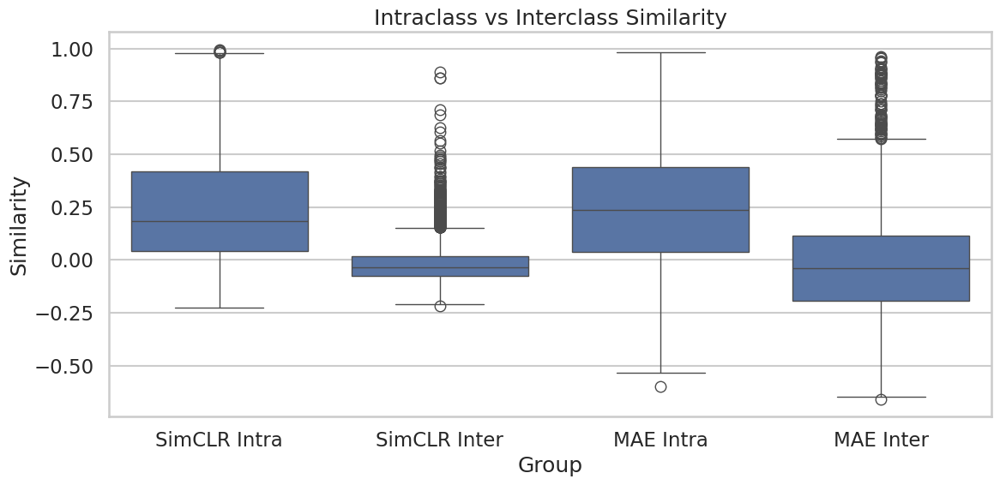

In [120]:
plt.figure(
    figsize=(12,6)
)

sns.boxplot(
    data=plot_df,
    x="Group",
    y="Similarity"
)

plt.title(
    "Intraclass vs Interclass Similarity"
)

plt.tight_layout()

plt.savefig(
    "intraclass_interclass_boxplot.png",
    dpi=300
)

plt.show()

# Qualitative Analysis

In [121]:
print(paths[:5])

['/kaggle/input/datasets/abtinzandi/obstacle-detection-dataset/ROD-Dataset/dataset/valid/images/IMG_20816.jpg'
 '/kaggle/input/datasets/abtinzandi/obstacle-detection-dataset/ROD-Dataset/dataset/valid/images/IMG_20817.jpg'
 '/kaggle/input/datasets/abtinzandi/obstacle-detection-dataset/ROD-Dataset/dataset/valid/images/IMG_20818.jpg'
 '/kaggle/input/datasets/abtinzandi/obstacle-detection-dataset/ROD-Dataset/dataset/valid/images/IMG_20819.jpg'
 '/kaggle/input/datasets/abtinzandi/obstacle-detection-dataset/ROD-Dataset/dataset/valid/images/IMG_20820.jpg']


In [122]:
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

In [123]:
simclr_norm = (
    simclr_embeddings
    /
    np.linalg.norm(
        simclr_embeddings,
        axis=1,
        keepdims=True
    )
)

mae_norm = (
    mae_embeddings
    /
    np.linalg.norm(
        mae_embeddings,
        axis=1,
        keepdims=True
    )
)

In [124]:
def retrieve_neighbors(
    embeddings,
    query_idx,
    k=5
):

    sims = cosine_similarity(
        embeddings[query_idx].reshape(1,-1),
        embeddings
    )[0]

    order = np.argsort(
        sims
    )[::-1]

    order = order[1:k+1]

    return order

In [125]:
def show_retrieval(
    embeddings,
    paths,
    query_idx,
    title,
    k=5
):

    neighbors = retrieve_neighbors(
        embeddings,
        query_idx,
        k=k
    )

    fig, axes = plt.subplots(
        1,
        k+1,
        figsize=(18,4)
    )

    query_img = Image.open(
        paths[query_idx]
    ).convert("RGB")

    axes[0].imshow(
        query_img
    )

    axes[0].set_title(
        "Query"
    )

    axes[0].axis("off")

    for i, idx in enumerate(neighbors):

        img = Image.open(
            paths[idx]
        ).convert("RGB")

        axes[i+1].imshow(
            img
        )

        axes[i+1].set_title(
            f"NN {i+1}"
        )

        axes[i+1].axis("off")

    plt.suptitle(
        title,
        fontsize=16
    )

    plt.tight_layout()

    plt.show()

In [126]:
np.random.seed(42)

query_indices = np.random.choice(
    len(paths),
    5,
    replace=False
)

query_indices

array([ 495, 1592, 2314, 1475, 2772])

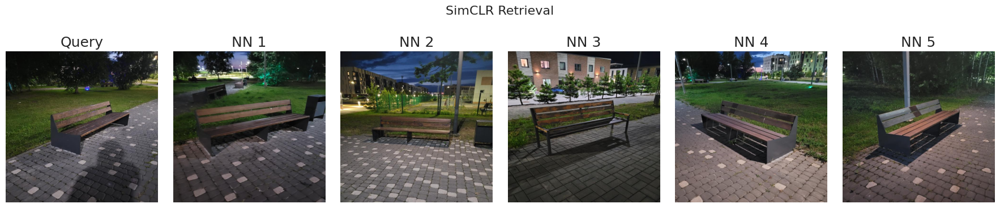

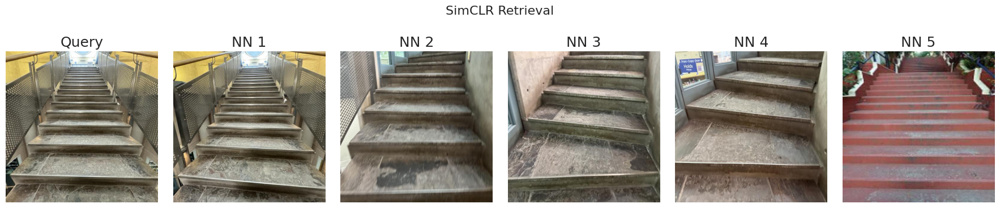

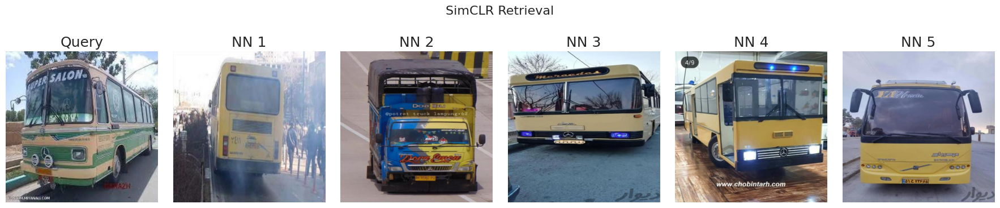

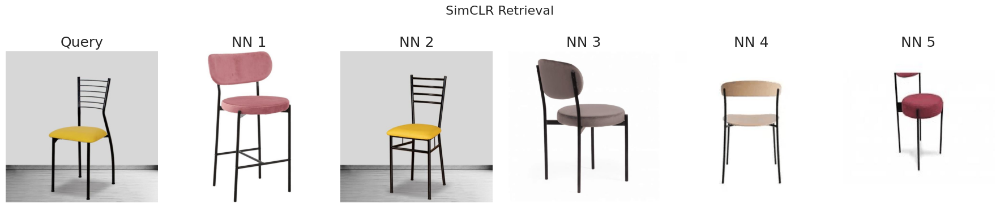

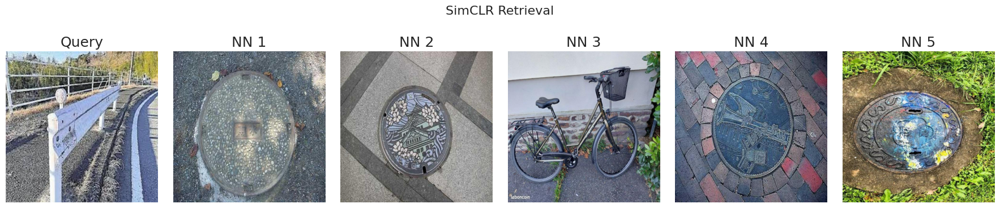

In [127]:
for idx in query_indices:

    show_retrieval(
        simclr_norm,
        paths,
        idx,
        "SimCLR Retrieval"
    )

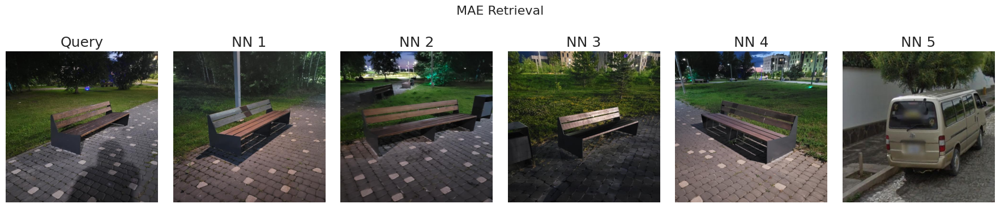

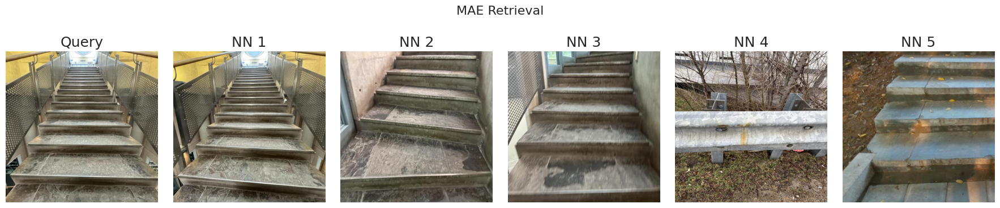

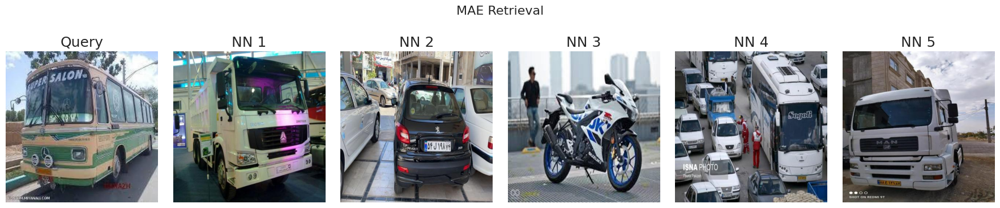

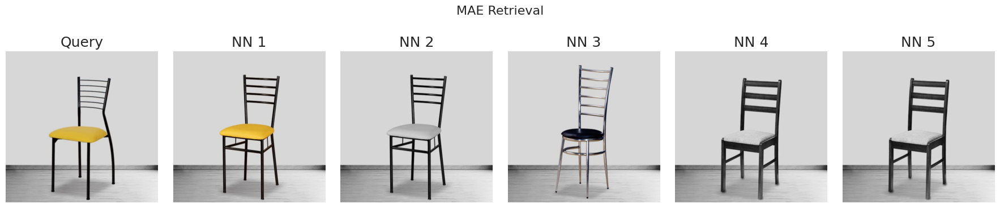

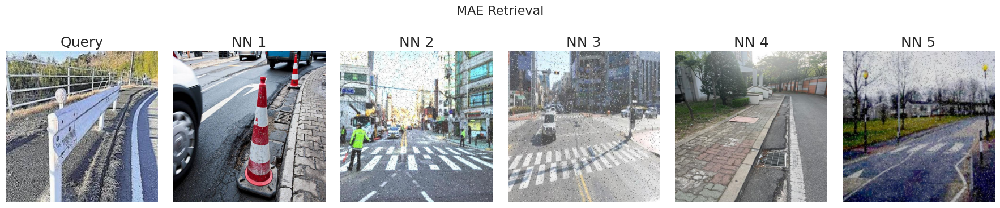

In [128]:
for idx in query_indices:

    show_retrieval(
        mae_norm,
        paths,
        idx,
        "MAE Retrieval"
    )

# Reconstruction Analysis

In [129]:
DATASET_DIR = "/kaggle/input/datasets/abtinzandi/obstacle-detection-dataset/ROD-Dataset/dataset/train/images"
import torch
import torch.nn as nn
import torch.nn.functional as F

from PIL import Image

from torch.utils.data import Dataset, DataLoader

In [130]:
class Config:
    dataset_dir = DATASET_DIR
    output_dir = "/kaggle/working/mae_checkpoints"

    image_size = 224
    patch_size = 16

    batch_size = 64

    epochs = 150

    learning_rate = 1.5e-4

    mask_ratio = 0.75

    embed_dim = 192
    depth = 12
    num_heads = 3

    decoder_dim = 256
    decoder_depth = 4
    decoder_heads = 8

    num_workers = 2

    seed = 42

config = Config()

In [131]:
class MLP(nn.Module):

    def __init__(
        self,
        dim,
        mlp_ratio=4.0
    ):

        super().__init__()

        hidden_dim = int(
            dim * mlp_ratio
        )

        self.net = nn.Sequential(
            nn.Linear(
                dim,
                hidden_dim
            ),
            nn.GELU(),
            nn.Linear(
                hidden_dim,
                dim
            )
        )

    def forward(
        self,
        x
    ):

        return self.net(x)


class TransformerBlock(nn.Module):

    def __init__(
        self,
        dim,
        num_heads
    ):

        super().__init__()

        self.norm1 = nn.LayerNorm(
            dim
        )

        self.attn = nn.MultiheadAttention(
            dim,
            num_heads,
            batch_first=True
        )

        self.norm2 = nn.LayerNorm(
            dim
        )

        self.mlp = MLP(dim)

    def forward(
        self,
        x
    ):

        y = self.norm1(x)

        y, _ = self.attn(
            y,
            y,
            y
        )

        x = x + y

        x = x + self.mlp(
            self.norm2(x)
        )

        return x

In [132]:
class MAE(nn.Module):

    def __init__(
        self,
        config
    ):

        super().__init__()

        self.patch_size = config.patch_size

        self.embed_dim = config.embed_dim

        self.mask_ratio = config.mask_ratio

        self.num_patches = (
            config.image_size //
            config.patch_size
        ) ** 2

        patch_dim = (
            3 *
            config.patch_size *
            config.patch_size
        )

        self.patch_embed = nn.Conv2d(
            3,
            config.embed_dim,
            kernel_size=config.patch_size,
            stride=config.patch_size
        )

        self.pos_embed = nn.Parameter(
            torch.randn(
                1,
                self.num_patches,
                config.embed_dim
            )
        )

        self.encoder = nn.ModuleList([
            TransformerBlock(
                config.embed_dim,
                config.num_heads
            )
            for _ in range(
                config.depth
            )
        ])

        self.encoder_norm = nn.LayerNorm(
            config.embed_dim
        )

        self.decoder_embed = nn.Linear(
            config.embed_dim,
            config.decoder_dim
        )

        self.mask_token = nn.Parameter(
            torch.randn(
                1,
                1,
                config.decoder_dim
            )
        )

        self.decoder_pos_embed = nn.Parameter(
            torch.randn(
                1,
                self.num_patches,
                config.decoder_dim
            )
        )

        self.decoder = nn.ModuleList([
            TransformerBlock(
                config.decoder_dim,
                config.decoder_heads
            )
            for _ in range(
                config.decoder_depth
            )
        ])

        self.decoder_norm = nn.LayerNorm(
            config.decoder_dim
        )

        self.decoder_pred = nn.Linear(
            config.decoder_dim,
            patch_dim
        )

    def patchify(
        self,
        imgs
    ):

        p = self.patch_size

        h = w = imgs.shape[2] // p

        x = imgs.reshape(
            imgs.shape[0],
            3,
            h,
            p,
            w,
            p
        )

        x = torch.einsum(
            "nchpwq->nhwpqc",
            x
        )

        x = x.reshape(
            imgs.shape[0],
            h * w,
            p * p * 3
        )

        return x

    def unpatchify(
        self,
        x
    ):

        p = self.patch_size

        h = w = int(
            x.shape[1] ** 0.5
        )

        x = x.reshape(
            x.shape[0],
            h,
            w,
            p,
            p,
            3
        )

        x = torch.einsum(
            "nhwpqc->nchpwq",
            x
        )

        imgs = x.reshape(
            x.shape[0],
            3,
            h * p,
            h * p
        )

        return imgs

    def random_masking(
        self,
        x
    ):

        N, L, D = x.shape

        len_keep = int(
            L * (1 - self.mask_ratio)
        )

        noise = torch.rand(
            N,
            L,
            device=x.device
        )

        ids_shuffle = torch.argsort(
            noise,
            dim=1
        )

        ids_restore = torch.argsort(
            ids_shuffle,
            dim=1
        )

        ids_keep = ids_shuffle[
            :,
            :len_keep
        ]

        x_masked = torch.gather(
            x,
            dim=1,
            index=ids_keep.unsqueeze(-1).repeat(
                1,
                1,
                D
            )
        )

        mask = torch.ones(
            N,
            L,
            device=x.device
        )

        mask[:, :len_keep] = 0

        mask = torch.gather(
            mask,
            dim=1,
            index=ids_restore
        )

        return (
            x_masked,
            mask,
            ids_restore
        )

    def forward_encoder(
        self,
        imgs
    ):

        x = self.patch_embed(
            imgs
        )

        x = x.flatten(2)

        x = x.transpose(1, 2)

        x = x + self.pos_embed

        x, mask, ids_restore = self.random_masking(
            x
        )

        for block in self.encoder:

            x = block(x)

        x = self.encoder_norm(
            x
        )

        return (
            x,
            mask,
            ids_restore
        )

    def forward_decoder(
        self,
        x,
        ids_restore
    ):

        x = self.decoder_embed(
            x
        )

        B, L, D = x.shape

        mask_tokens = self.mask_token.repeat(
            B,
            ids_restore.shape[1] - L,
            1
        )

        x_ = torch.cat(
            [
                x,
                mask_tokens
            ],
            dim=1
        )

        x_ = torch.gather(
            x_,
            dim=1,
            index=ids_restore.unsqueeze(-1).repeat(
                1,
                1,
                D
            )
        )

        x_ = x_ + self.decoder_pos_embed

        for block in self.decoder:

            x_ = block(x_)

        x_ = self.decoder_norm(
            x_
        )

        pred = self.decoder_pred(
            x_
        )

        return pred

    def forward(
        self,
        imgs
    ):

        latent, mask, ids_restore = self.forward_encoder(
            imgs
        )

        pred = self.forward_decoder(
            latent,
            ids_restore
        )

        return pred, mask

In [137]:
FULL_MAE = "/kaggle/input/notebooks/mehtab9001/better-mae/mae_checkpoints/mae_epoch_150.pt"
device = torch.device(
    "cuda" if torch.cuda.is_available()
    else "cpu"
)


ckpt = torch.load(
    FULL_MAE,
    map_location=device
)

mae = MAE(config)

mae.load_state_dict(
    ckpt["model_state_dict"]
)

mae = mae.to(device)
mae.eval()

print("Full MAE loaded")

Full MAE loaded


In [138]:
def reconstruct_image(
    model,
    image
):

    with torch.no_grad():

        image = image.unsqueeze(0).to(device)

        latent, mask, ids_restore = model.forward_encoder(
            image
        )

        pred = model.forward_decoder(
            latent,
            ids_restore
        )

        recon = model.unpatchify(
            pred
        )

    return (
        image[0].cpu(),
        recon[0].cpu(),
        mask[0].cpu()
    )

In [139]:
mean = torch.tensor(
    [0.485,0.456,0.406]
).view(3,1,1)

std = torch.tensor(
    [0.229,0.224,0.225]
).view(3,1,1)

def denorm(x):

    x = x * std + mean

    x = torch.clamp(
        x,
        0,
        1
    )

    return x

In [140]:
from pathlib import Path
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )
])

class ReconstructionDataset(Dataset):

    def __init__(self, image_dir):

        self.images = sorted(
            list(
                Path(image_dir).glob("*")
            )
        )

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):

        image = Image.open(
            self.images[idx]
        ).convert("RGB")

        image = transform(image)

        return image


dataset = ReconstructionDataset(
    DATASET_DIR
)

print(
    "Images:",
    len(dataset)
)

Images: 19186


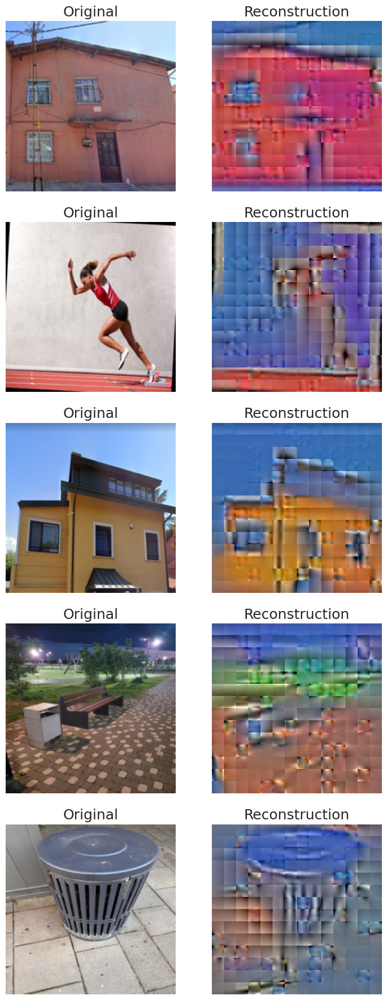

In [145]:
import random
import matplotlib.pyplot as plt

indices = random.sample(
    range(len(dataset)),
    5
)

fig, axes = plt.subplots(
    5,
    2,
    figsize=(8,18)
)

for row, idx in enumerate(indices):

    image = dataset[idx]

    original, recon, mask = reconstruct_image(
        mae,
        image
    )

    axes[row,0].imshow(
        denorm(original).permute(1,2,0)
    )

    axes[row,0].set_title("Original")

    axes[row,1].imshow(
        denorm(recon).permute(1,2,0)
    )

    axes[row,1].set_title("Reconstruction")

    axes[row,0].axis("off")
    axes[row,1].axis("off")

plt.tight_layout()

plt.savefig(
    "mae_reconstruction_grid.png",
    dpi=300
)

plt.show()

In [143]:
image = dataset[0]

print("input:", image.shape)

try:

    original, recon, mask = reconstruct_image(
        mae,
        image
    )

    print("original:", original.shape)
    print("recon:", recon.shape)
    print("mask:", mask.shape)

except Exception as e:

    print(type(e))
    print(e)

input: torch.Size([3, 224, 224])
original: torch.Size([3, 224, 224])
recon: torch.Size([3, 224, 224])
mask: torch.Size([196])


In [146]:
def make_masked_image(image, mask, patch_size=16):

    image = image.clone()

    H = W = 224
    num_patches_side = H // patch_size

    mask = mask.reshape(
        num_patches_side,
        num_patches_side
    )

    for i in range(num_patches_side):
        for j in range(num_patches_side):

            if mask[i, j] == 1:

                image[
                    :,
                    i*patch_size:(i+1)*patch_size,
                    j*patch_size:(j+1)*patch_size
                ] = 0

    return image

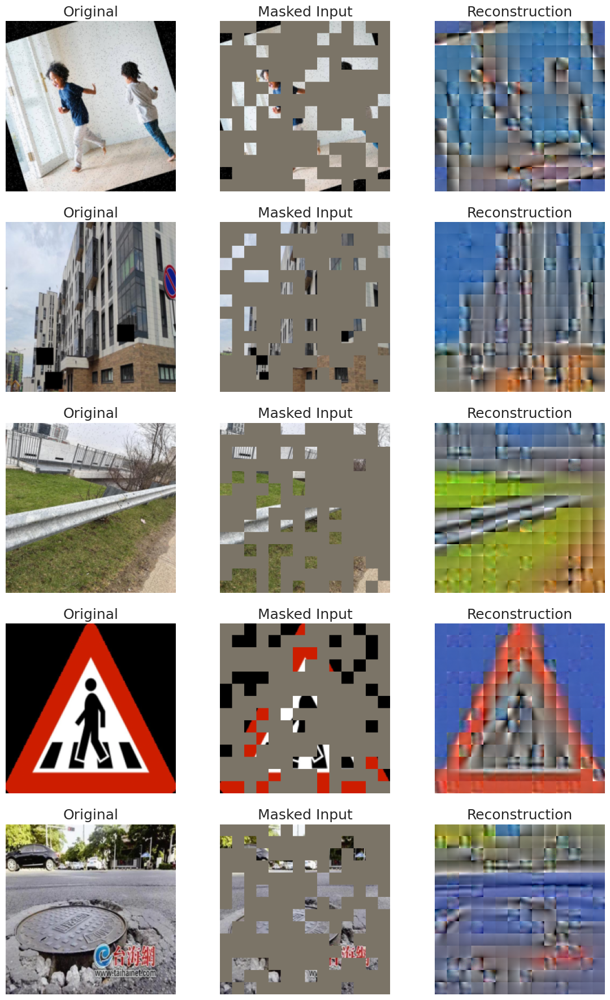

In [152]:
import random
import matplotlib.pyplot as plt

indices = random.sample(
    range(len(dataset)),
    5
)

fig, axes = plt.subplots(
    5,
    3,
    figsize=(12,18)
)

for row, idx in enumerate(indices):

    image = dataset[idx]

    original, recon, mask = reconstruct_image(
        mae,
        image
    )

    masked = make_masked_image(
        original,
        mask,
        patch_size=16
    )

    axes[row,0].imshow(
        denorm(original).permute(1,2,0)
    )
    axes[row,0].set_title("Original")

    axes[row,1].imshow(
        denorm(masked).permute(1,2,0)
    )
    axes[row,1].set_title("Masked Input")

    axes[row,2].imshow(
        denorm(recon).permute(1,2,0)
    )
    axes[row,2].set_title("Reconstruction")

    for ax in axes[row]:
        ax.axis("off")

plt.tight_layout()

plt.savefig(
    "mae_reconstruction_report.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()